In [1]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Generate synthetic dataset (larger)
def generate_synthetic_data(num_samples):
    # Generate random sensor readings for accelerometer and gyroscope
    accelerometer_data = np.random.rand(num_samples, 3)  # 3-axis accelerometer
    gyroscope_data = np.random.rand(num_samples, 3)  # 3-axis gyroscope
    
    # Generate random activity labels
    activities = ['walking', 'running', 'sitting', 'standing']
    labels = np.random.choice(activities, num_samples)
    
    return accelerometer_data, gyroscope_data, labels

# Generate synthetic data (larger)
num_samples = 10000  # Increase number of samples
X_accelerometer, X_gyroscope, y = generate_synthetic_data(num_samples)

# Merge accelerometer and gyroscope data
X = np.concatenate((X_accelerometer, X_gyroscope), axis=1)

# Encode activity labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)


In [2]:
import tensorflow as tf

# Define MLP model
def create_mlp_model(input_shape, num_classes):
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(64, activation='relu', input_shape=input_shape),
        tf.keras.layers.Dense(32, activation='relu'),
        tf.keras.layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
    return model

# Create MLP model
input_shape = (X_train.shape[1],)
num_classes = len(np.unique(y))
model = create_mlp_model(input_shape, num_classes)

# Train model
history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_split=0.1)


Epoch 1/20
225/225 [==============================] - 3s 6ms/step - loss: 1.3899 - accuracy: 0.2478 - val_loss: 1.3846 - val_accuracy: 0.2600
Epoch 2/20
225/225 [==============================] - 1s 4ms/step - loss: 1.3858 - accuracy: 0.2611 - val_loss: 1.3852 - val_accuracy: 0.2625
Epoch 3/20
225/225 [==============================] - 1s 4ms/step - loss: 1.3863 - accuracy: 0.2562 - val_loss: 1.3859 - val_accuracy: 0.2700
Epoch 4/20
225/225 [==============================] - 1s 4ms/step - loss: 1.3849 - accuracy: 0.2665 - val_loss: 1.3874 - val_accuracy: 0.2300
Epoch 5/20
225/225 [==============================] - 2s 9ms/step - loss: 1.3845 - accuracy: 0.2640 - val_loss: 1.3865 - val_accuracy: 0.2550
Epoch 6/20
225/225 [==============================] - 1s 6ms/step - loss: 1.3842 - accuracy: 0.2674 - val_loss: 1.3853 - val_accuracy: 0.2575
Epoch 7/20
225/225 [==============================] - 1s 4ms/step - loss: 1.3833 - accuracy: 0.2708 - val_loss: 1.3865 - val_accuracy: 0.2550
Epoch 

In [3]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt

# Evaluate model
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f'Test Accuracy: {test_accuracy}')

# Predictions
y_pred = np.argmax(model.predict(X_test), axis=-1)

# Accuracy
print("Accuracy:", accuracy_score(y_test, y_pred))

# Classification report
print("Classification Report:\n", classification_report(y_test, y_pred))

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", conf_matrix)


63/63 [==============================] - 1s 4ms/step - loss: 1.3926 - accuracy: 0.2465
Test Accuracy: 0.24650000035762787
63/63 [==============================] - 0s 3ms/step
Accuracy: 0.2465
Classification Report:
               precision    recall  f1-score   support

           0       0.22      0.10      0.14       478
           1       0.27      0.42      0.33       527
           2       0.25      0.13      0.18       505
           3       0.23      0.32      0.27       490

    accuracy                           0.25      2000
   macro avg       0.24      0.24      0.23      2000
weighted avg       0.24      0.25      0.23      2000

Confusion Matrix:
 [[ 48 202  70 158]
 [ 49 220  76 182]
 [ 58 192  68 187]
 [ 66 209  58 157]]


C:\Users\avisa\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\avisa\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\avisa\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\avisa\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

<Figure size 1200x800 with 0 Axes>

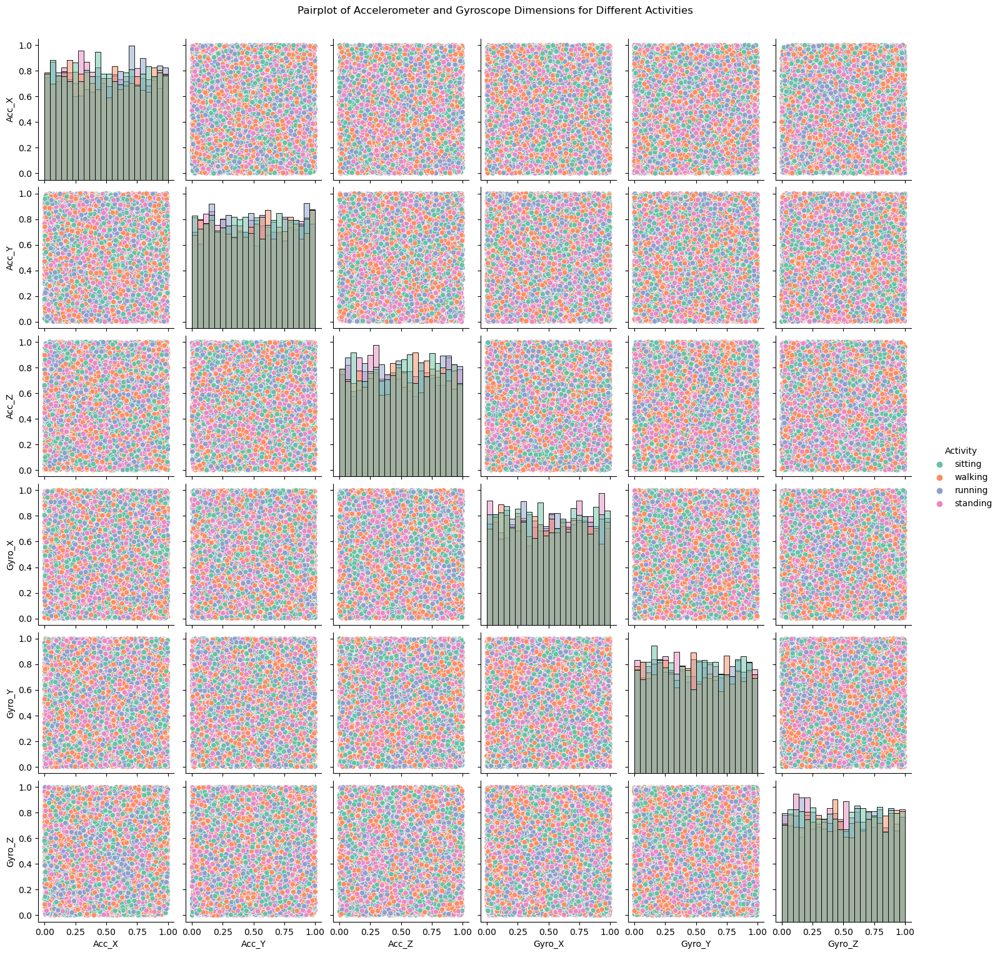

In [11]:
import seaborn as sns
import pandas as pd
# Convert the data into a DataFrame for easier visualization
df = pd.DataFrame(X, columns=['Acc_X', 'Acc_Y', 'Acc_Z', 'Gyro_X', 'Gyro_Y', 'Gyro_Z'])
df['Activity'] = y

# Plot pairplot for all attributes for all activities
plt.figure(figsize=(12, 8))
sns.pairplot(df, hue='Activity', palette='Set2', diag_kind='hist')
plt.suptitle('Pairplot of Accelerometer and Gyroscope Dimensions for Different Activities', y=1.02)
plt.show()


C:\Users\avisa\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\avisa\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\avisa\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\avisa\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

<Figure size 1200x800 with 0 Axes>

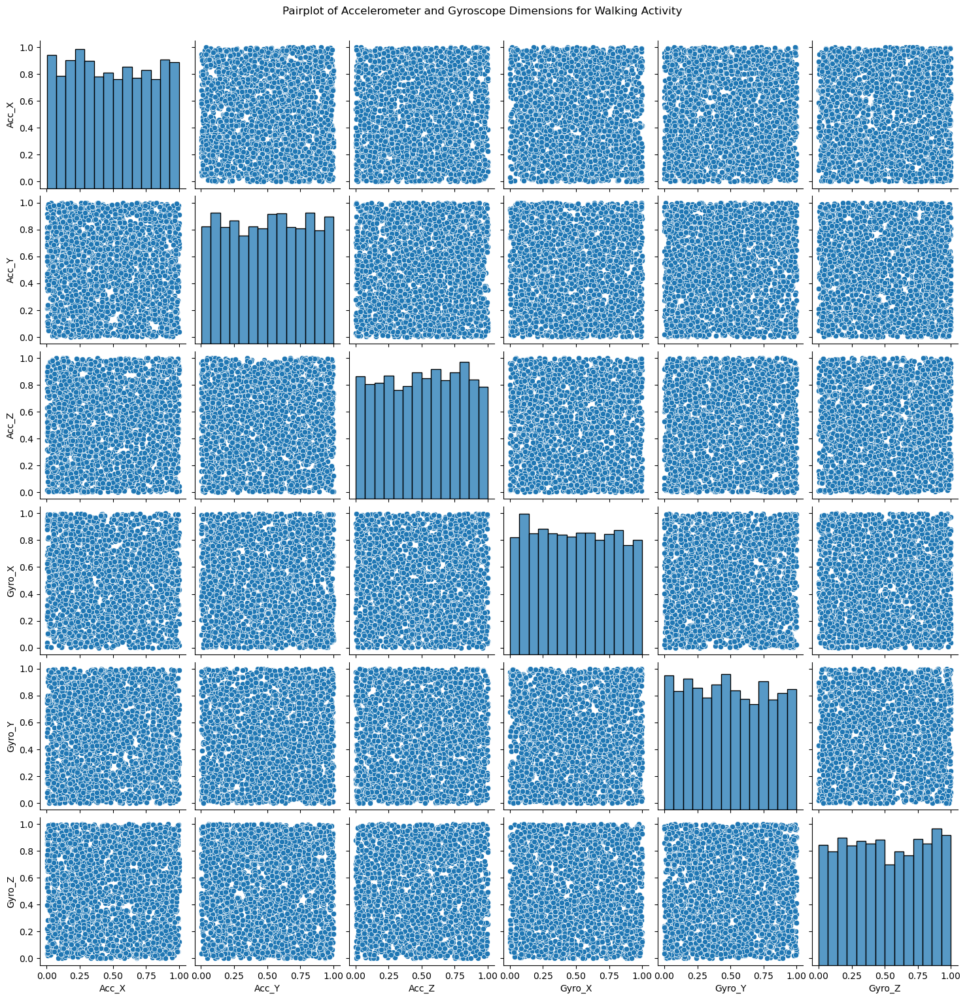

C:\Users\avisa\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\avisa\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\avisa\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\avisa\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

<Figure size 1200x800 with 0 Axes>

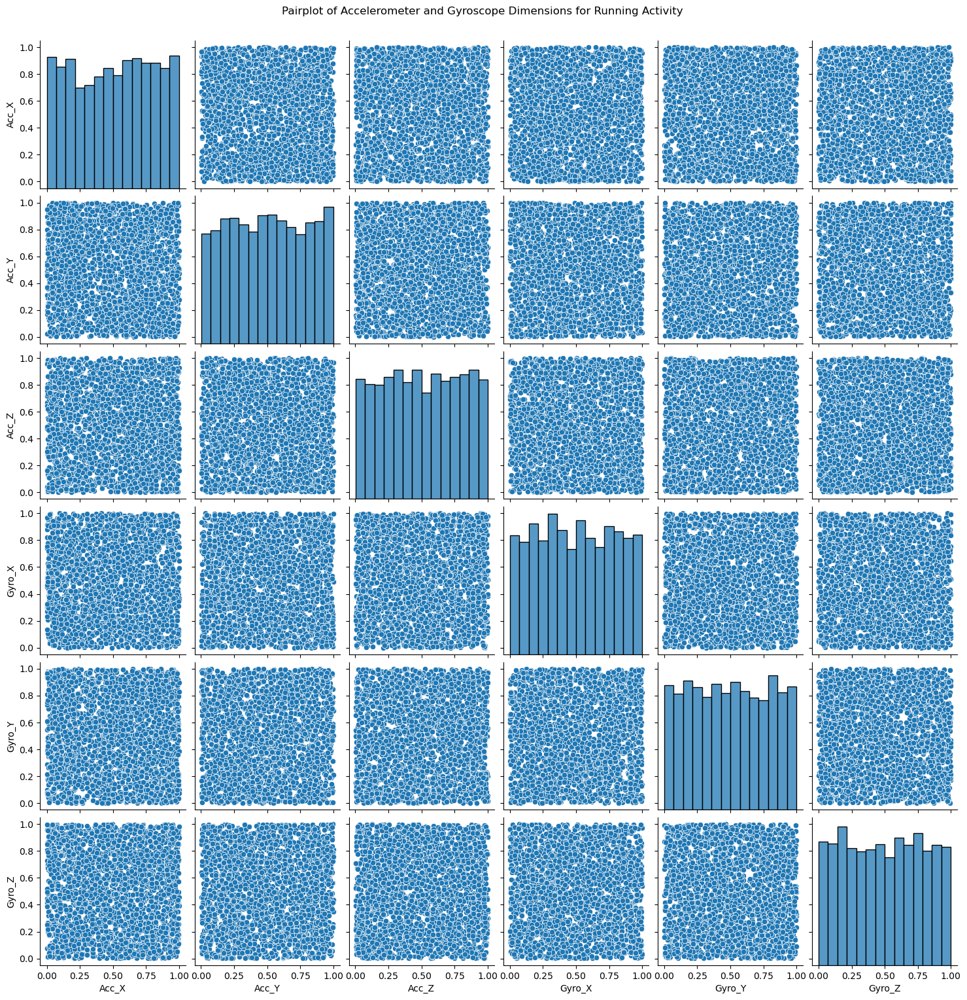

C:\Users\avisa\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\avisa\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\avisa\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\avisa\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

<Figure size 1200x800 with 0 Axes>

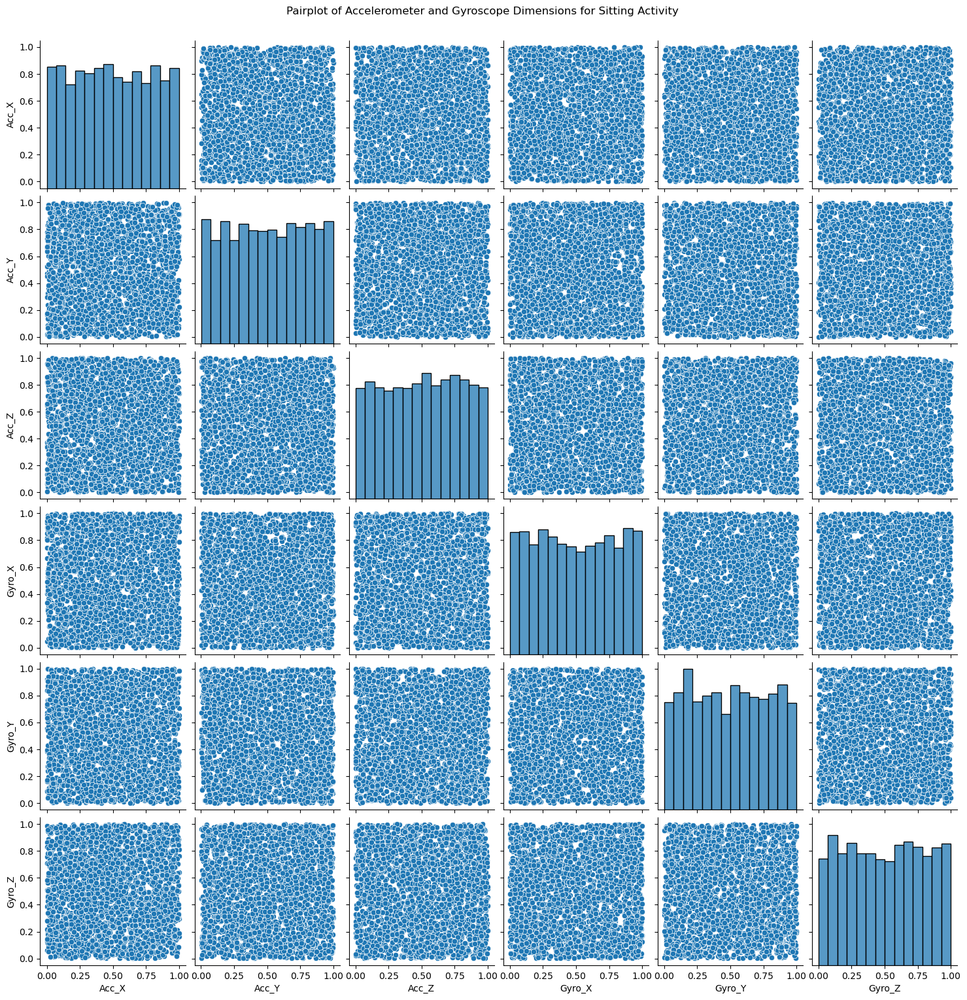

C:\Users\avisa\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\avisa\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\avisa\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\avisa\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

<Figure size 1200x800 with 0 Axes>

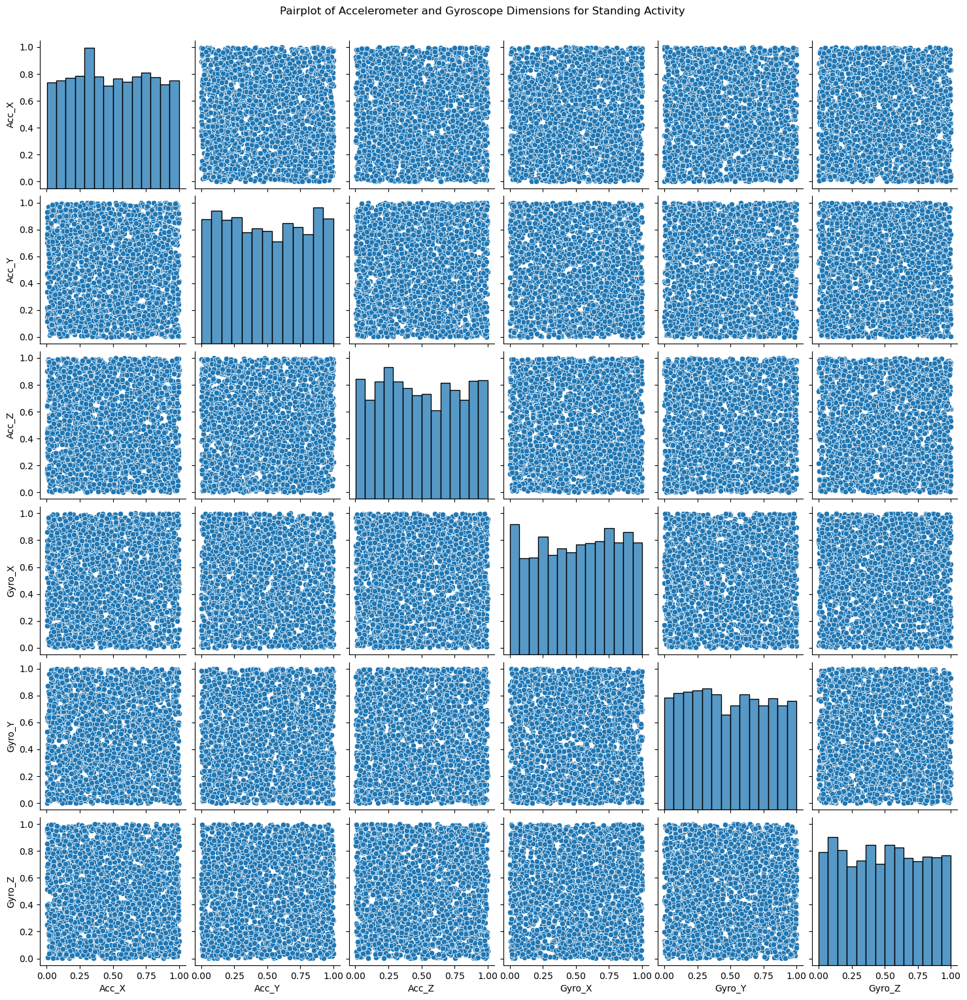

In [12]:
import seaborn as sns

# Convert the data into a DataFrame for easier visualization
df = pd.DataFrame(X, columns=['Acc_X', 'Acc_Y', 'Acc_Z', 'Gyro_X', 'Gyro_Y', 'Gyro_Z'])
df['Activity'] = y

# Iterate over each activity and create a pairplot
activities = ['walking', 'running', 'sitting', 'standing']
for activity in activities:
    activity_df = df[df['Activity'] == activity]
    plt.figure(figsize=(12, 8))
    sns.pairplot(activity_df.drop(columns=['Activity']), diag_kind='hist')
    plt.suptitle(f'Pairplot of Accelerometer and Gyroscope Dimensions for {activity.capitalize()} Activity', y=1.02)
    plt.show()


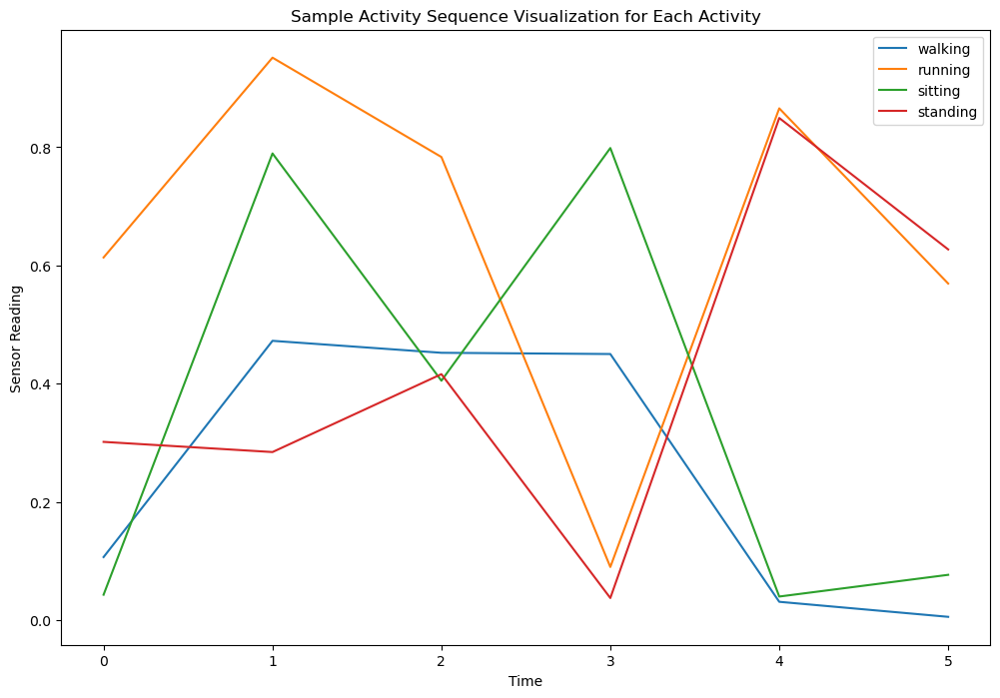

In [13]:
plt.figure(figsize=(12, 8))
for activity in activities:
    activity_df = df[df['Activity'] == activity].sample(1)
    plt.plot(activity_df.drop(columns=['Activity']).values.flatten(), label=activity)
plt.xlabel('Time')
plt.ylabel('Sensor Reading')
plt.title('Sample Activity Sequence Visualization for Each Activity')
plt.legend()
plt.show()


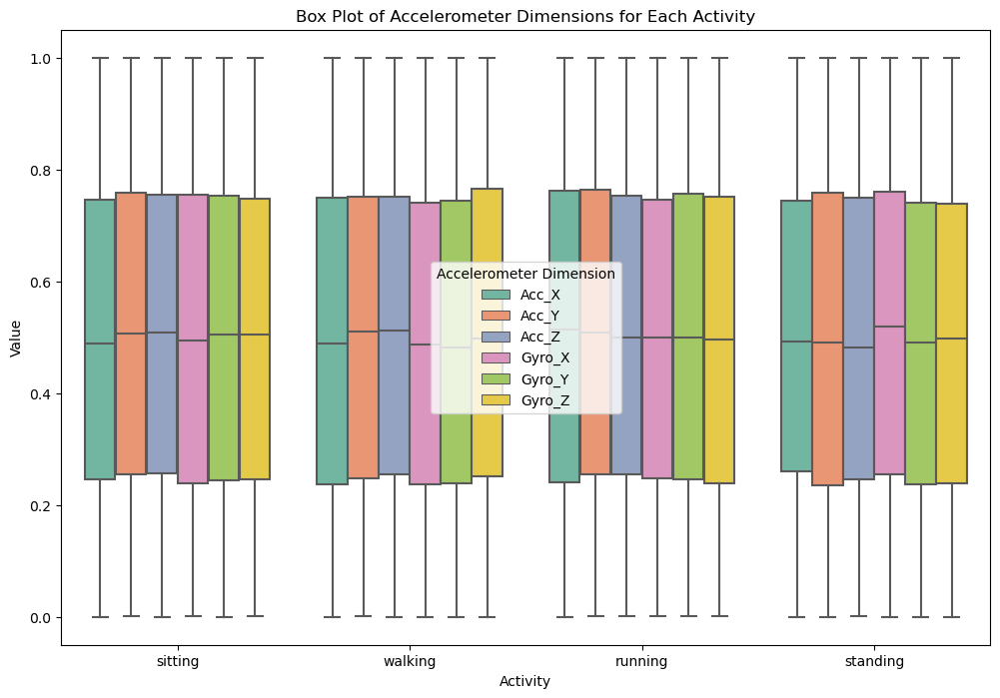

In [15]:
import seaborn as sns
import pandas as pd

# Assuming df is the DataFrame containing the data

# Melt the DataFrame to reshape it for visualization
df_melted = df.melt(id_vars='Activity', var_name='Accelerometer Dimension', value_name='Value')

# Block 3: Box Plot of Accelerometer and Gyroscope Dimensions for Each Activity
plt.figure(figsize=(12, 8))
sns.boxplot(x='Activity', y='Value', hue='Accelerometer Dimension', data=df_melted, palette='Set2')
plt.xlabel('Activity')
plt.ylabel('Value')
plt.title('Box Plot of Accelerometer Dimensions for Each Activity')
plt.show()


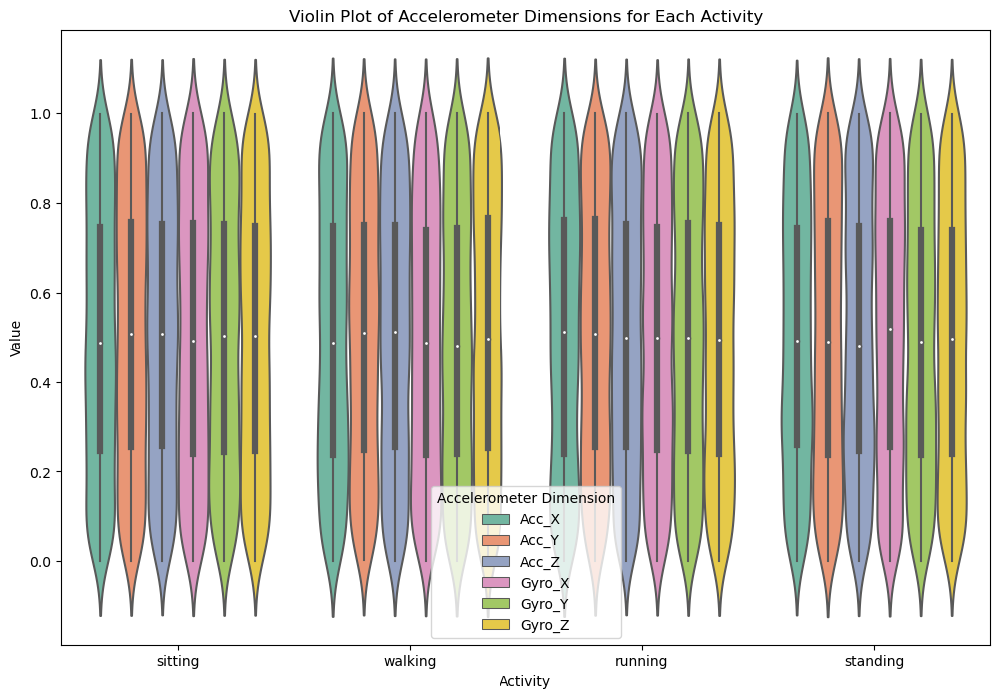

In [17]:
plt.figure(figsize=(12, 8))
sns.violinplot(x='Activity', y='Value', hue='Accelerometer Dimension', data=df_melted, palette='Set2')
plt.xlabel('Activity')
plt.ylabel('Value')
plt.title('Violin Plot of Accelerometer Dimensions for Each Activity')
plt.show()


C:\Users\avisa\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


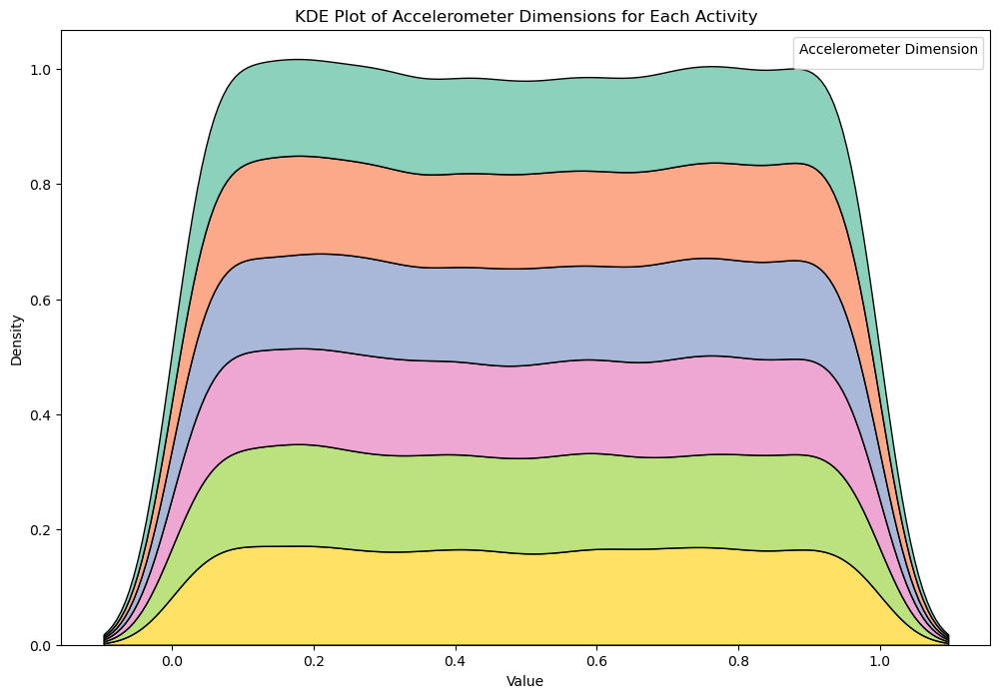

In [24]:
plt.figure(figsize=(12, 8))
sns.kdeplot(data=df_melted, x='Value', hue='Accelerometer Dimension', fill=True, palette='Set2', multiple='stack')
plt.xlabel('Value')
plt.ylabel('Density')
plt.title('KDE Plot of Accelerometer Dimensions for Each Activity')
plt.legend(title='Accelerometer Dimension')
plt.show()


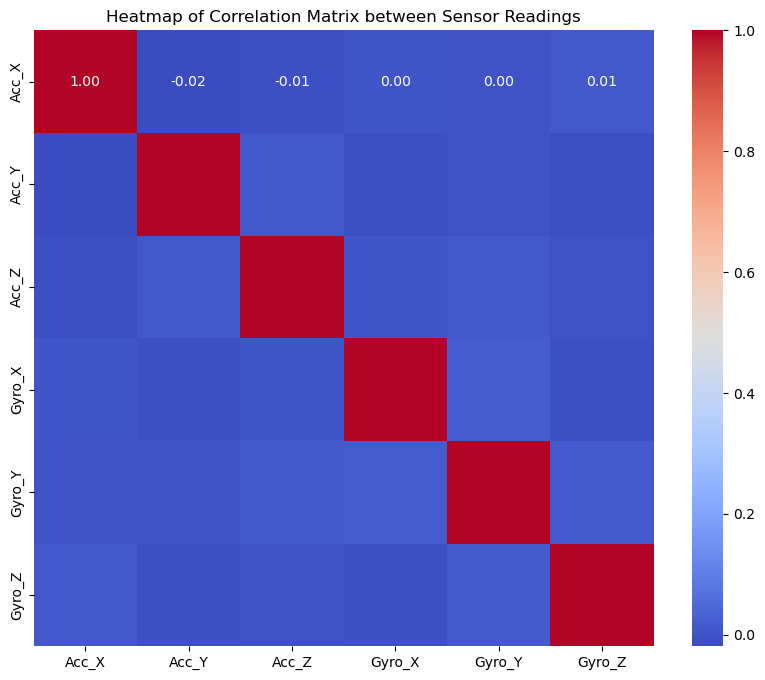

In [25]:
correlation_matrix = df.drop(columns=['Activity']).corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Heatmap of Correlation Matrix between Sensor Readings')
plt.show()


C:\Users\avisa\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\avisa\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\avisa\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\avisa\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

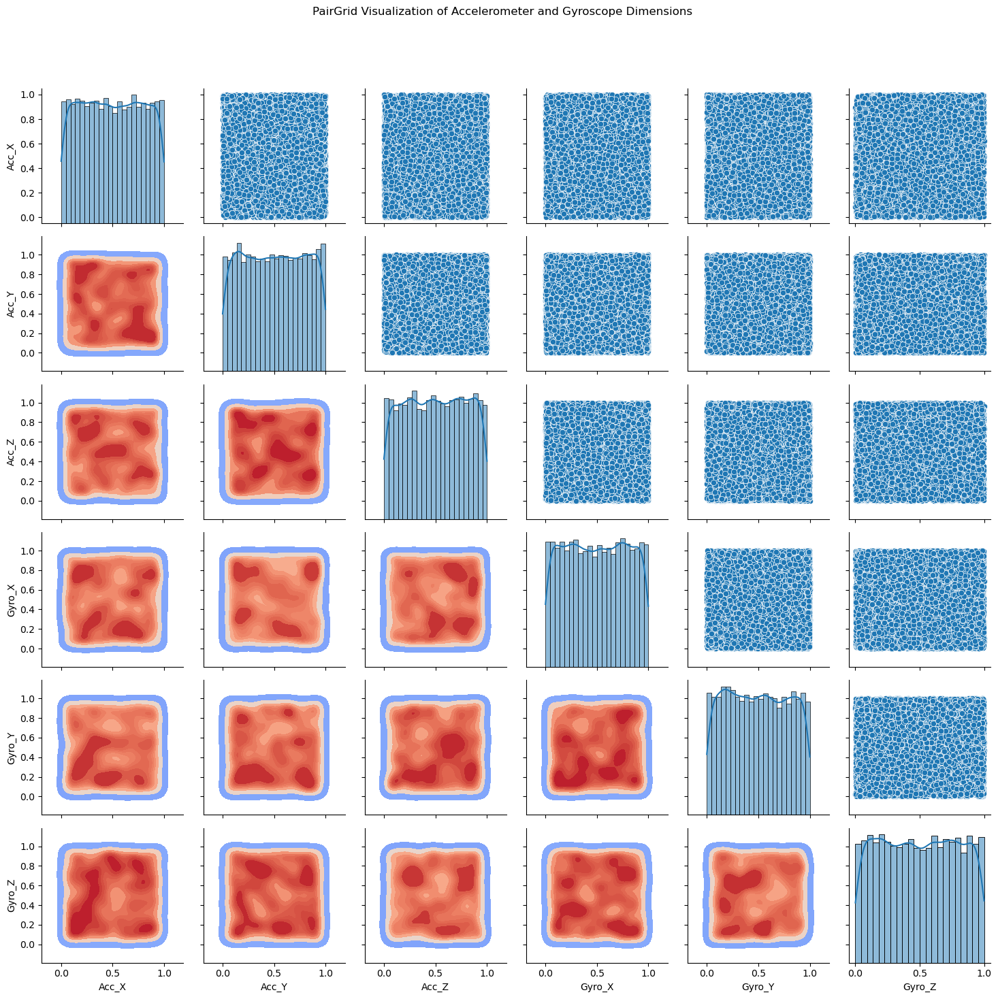

In [26]:
g = sns.PairGrid(df.drop(columns=['Activity']), diag_sharey=False)
g.map_upper(sns.scatterplot, palette='Set2')
g.map_lower(sns.kdeplot, cmap='coolwarm', fill=True)
g.map_diag(sns.histplot, kde=True)
plt.subplots_adjust(top=0.9)
g.fig.suptitle('PairGrid Visualization of Accelerometer and Gyroscope Dimensions')
plt.show()


C:\Users\avisa\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\avisa\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\avisa\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\avisa\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

<Figure size 1200x800 with 0 Axes>

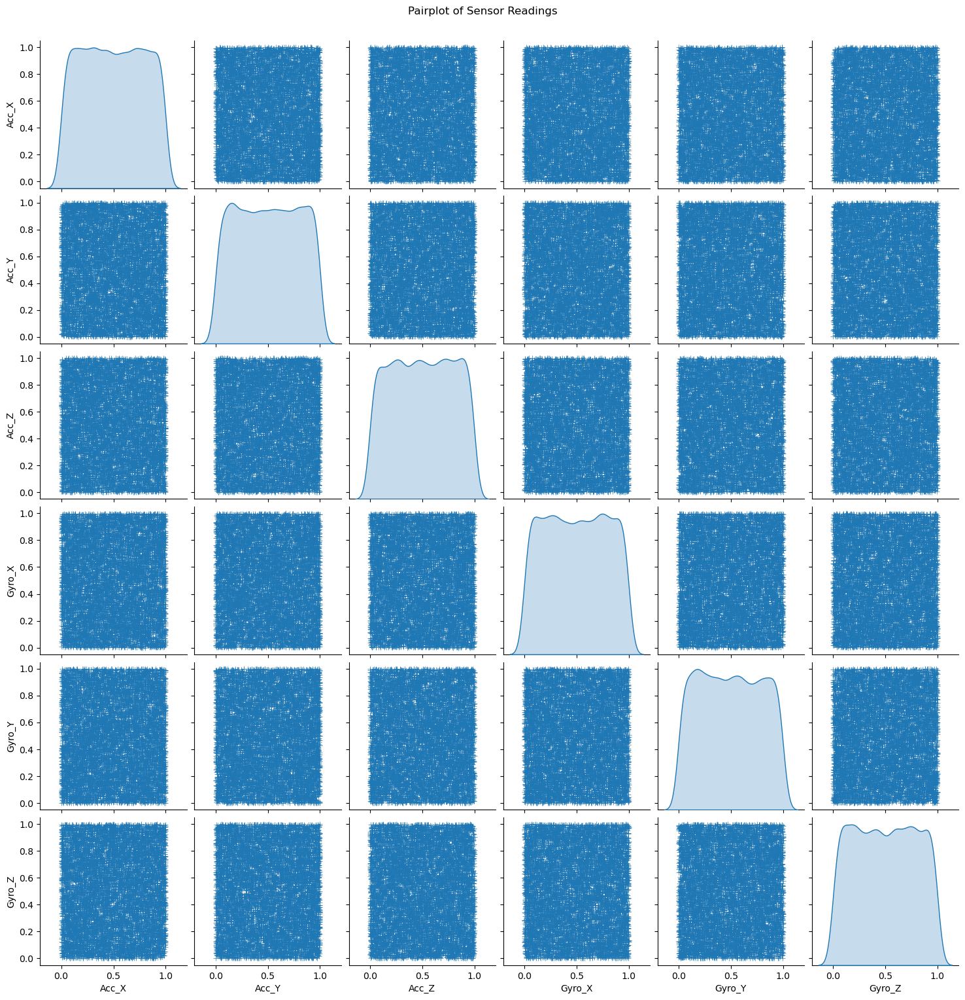

In [27]:
# Block 10: Pairplot of Sensor Readings
plt.figure(figsize=(12, 8))
sns.pairplot(df.drop(columns='Activity'), diag_kind='kde', markers='+')
plt.suptitle('Pairplot of Sensor Readings', y=1.02)
plt.show()
